# 🚀 Embedding Model Comparison for Clustering Quality

**Goal:** Improve silhouette score from 0.0353 to 0.4+ by testing better embedding models

**Hypothesis:** Larger, better embedding models will naturally separate categories, eliminating the need for TF-IDF features.

**Data Sources:**
- **16 MMLU subjects** (academic: CS, math, physics, chemistry, logic, etc.)
- **9 Code MMLU subsets** (coding: API frameworks, code completion, DBMS/SQL, execution prediction, etc.)
- **Total:** ~3,500 questions across 25 categories

**Current Baseline:**
- Model: `all-MiniLM-L6-v2` (384D)
- K: 20 clusters
- Silhouette: 0.0353 ❌

**Models to Test:**
1. **all-MiniLM-L6-v2** (384D) - Baseline
2. **all-mpnet-base-v2** (768D) - Better general embeddings
3. **microsoft/codebert-base** (768D) - Code-specific
4. **BAAI/bge-large-en-v1.5** (1024D) - State-of-the-art

---
**📝 Designed for Google Colab** - Completely standalone, no external dependencies!

## 0. 🔧 Colab Setup (Run This First!)

In [1]:
# Install required packages
!pip install -q sentence-transformers datasets umap-learn scikit-learn matplotlib seaborn pandas numpy

print("✅ All packages installed!")

✅ All packages installed!


In [2]:
# Check GPU availability
import torch

if torch.cuda.is_available():
    device = 'cuda'
    print(f"🎮 GPU detected: {torch.cuda.get_device_name(0)}")
    print(f"   Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")
else:
    device = 'cpu'
    print("💻 Running on CPU (this will be slower)")
    print("   💡 To enable GPU: Runtime → Change runtime type → GPU")

🎮 GPU detected: NVIDIA L4
   Memory: 23.8 GB


## 1. 📦 Imports & Configuration

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from typing import List, Dict
import warnings
warnings.filterwarnings('ignore')

# Dimensionality reduction
from sklearn.manifold import TSNE
import umap

# Clustering
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.preprocessing import normalize

# Embeddings
from sentence_transformers import SentenceTransformer

# Data loading
from datasets import load_dataset

# Visualization settings
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# Set seeds for reproducibility
np.random.seed(42)

print("✅ Setup complete!")

✅ Setup complete!


## 2. 📥 Load Data from HuggingFace

We'll load:
- **16 MMLU subjects** (academic: CS, math, physics, logic, chemistry, etc.)
- **9 Code MMLU subsets** (coding: API frameworks, code completion, DBMS/SQL, execution prediction, etc.)

In [4]:
def load_training_data(max_samples=3500):
    """
    Load MMLU + Code MMLU data:
    - 16 MMLU subjects (academic questions)
    - 9 Code MMLU subsets (coding questions)
    """
    questions = []

    # MMLU subjects (academic)
    mmlu_subsets = [
        "college_computer_science",
        "high_school_computer_science",
        "college_mathematics",
        "high_school_mathematics",
        "formal_logic",
        "machine_learning",
        "college_physics",
        "high_school_physics",
        "computer_security",
        "electrical_engineering",
        "abstract_algebra",
        "astronomy",
        "elementary_mathematics",
        "college_chemistry",
        "high_school_chemistry",
        "conceptual_physics",
    ]

    # Code MMLU subsets (coding)
    code_mmlu_subsets = [
        "api_frameworks",
        "code_completion",
        "code_repair",
        "dbms_sql",
        "execution_prediction",
        "fill_in_the_middle",
        "others",
        "programming_syntax",
        "software_principles",
    ]

    total_sources = len(mmlu_subsets) + len(code_mmlu_subsets)
    questions_per_source = max_samples // total_sources

    print("="*60)
    print("LOADING DATA (MMLU + Code MMLU)")
    print("="*60)
    print(f"Target: ~{max_samples} questions total")
    print(f"MMLU subjects: {len(mmlu_subsets)}")
    print(f"Code MMLU subsets: {len(code_mmlu_subsets)}")
    print(f"Questions per source: ~{questions_per_source}")
    print()

    # 1. Load MMLU subjects
    print(f"1. Loading MMLU subjects...")
    for subset in mmlu_subsets:
        try:
            print(f"   {subset}...", end=" ")
            dataset = load_dataset("cais/mmlu", subset, split="test", trust_remote_code=True)
            count = 0

            for idx, item in enumerate(dataset):
                if count >= questions_per_source:
                    break

                question_text = item.get("question", "")
                choices = item.get("choices", [])
                answer_idx = item.get("answer", 0)

                # Convert index to A/B/C/D
                if isinstance(answer_idx, int) and 0 <= answer_idx < 4:
                    answer = chr(65 + answer_idx)
                else:
                    continue

                if question_text and len(choices) == 4:
                    questions.append({
                        "question_id": f"mmlu_{subset}_{idx}",
                        "question": question_text,
                        "category": f"mmlu_{subset}",
                        "choices": choices,
                    })
                    count += 1

            print(f"✓ ({count})")

        except Exception as e:
            print(f"✗ Error: {e}")

    # 2. Load Code MMLU subsets
    print(f"\n2. Loading Code MMLU subsets...")
    for subset in code_mmlu_subsets:
        try:
            print(f"   {subset}...", end=" ")
            dataset = load_dataset("Fsoft-AIC/CodeMMLU", subset, split="test", trust_remote_code=True)
            count = 0

            for idx, item in enumerate(dataset):
                if count >= questions_per_source:
                    break

                question_text = item.get("question", "")
                choices = item.get("choices", [])
                answer = item.get("answer", "")

                # Ensure answer is uppercase single letter
                if answer and len(answer) == 1:
                    answer = answer.upper()
                else:
                    continue

                # Pad choices to 4 if needed
                if len(choices) < 4:
                    while len(choices) < 4:
                        choices.append(f"[Option {chr(65+len(choices))}]")

                if question_text and len(choices) >= 2:
                    questions.append({
                        "question_id": f"code_mmlu_{subset}_{idx}",
                        "question": question_text,
                        "category": f"code_mmlu_{subset}",
                        "choices": choices[:4],
                    })
                    count += 1

            print(f"✓ ({count})")

        except Exception as e:
            print(f"✗ Error: {e}")

    print(f"\n{'='*60}")
    print(f"✅ Total loaded: {len(questions)} questions")
    print(f"   Categories: {len(set(q['category'] for q in questions))}")
    print(f"{'='*60}")

    return questions

# Load data
questions = load_training_data(max_samples=3500)

print(f"\n📊 Sample questions:")
print(f"\n1. MMLU example:")
mmlu_q = [q for q in questions if q['category'].startswith('mmlu_')][0]
print(f"   Category: {mmlu_q['category']}")
print(f"   Question: {mmlu_q['question'][:120]}...")

print(f"\n2. Code MMLU example:")
code_q = [q for q in questions if q['category'].startswith('code_mmlu_')][0]
print(f"   Category: {code_q['category']}")
print(f"   Question: {code_q['question'][:120]}...")

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.
ERROR:datasets.load:`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.


LOADING DATA (MMLU + Code MMLU)
Target: ~3500 questions total
MMLU subjects: 16
Code MMLU subsets: 9
Questions per source: ~140

1. Loading MMLU subjects...
   college_computer_science... 

README.md: 0.00B [00:00, ?B/s]

dataset_infos.json: 0.00B [00:00, ?B/s]

college_computer_science/test-00000-of-0(…):   0%|          | 0.00/28.1k [00:00<?, ?B/s]

college_computer_science/validation-0000(…):   0%|          | 0.00/6.25k [00:00<?, ?B/s]

college_computer_science/dev-00000-of-00(…):   0%|          | 0.00/6.81k [00:00<?, ?B/s]

Generating test split:   0%|          | 0/100 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/11 [00:00<?, ? examples/s]

Generating dev split:   0%|          | 0/5 [00:00<?, ? examples/s]

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.
ERROR:datasets.load:`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.


✓ (100)
   high_school_computer_science... 

high_school_computer_science/test-00000-(…):   0%|          | 0.00/27.3k [00:00<?, ?B/s]

high_school_computer_science/validation-(…):   0%|          | 0.00/5.28k [00:00<?, ?B/s]

high_school_computer_science/dev-00000-o(…):   0%|          | 0.00/6.54k [00:00<?, ?B/s]

Generating test split:   0%|          | 0/100 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/9 [00:00<?, ? examples/s]

Generating dev split:   0%|          | 0/5 [00:00<?, ? examples/s]

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.
ERROR:datasets.load:`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.


✓ (100)
   college_mathematics... 

college_mathematics/test-00000-of-00001.(…):   0%|          | 0.00/16.6k [00:00<?, ?B/s]

college_mathematics/validation-00000-of-(…):   0%|          | 0.00/5.00k [00:00<?, ?B/s]

college_mathematics/dev-00000-of-00001.p(…):   0%|          | 0.00/5.16k [00:00<?, ?B/s]

Generating test split:   0%|          | 0/100 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/11 [00:00<?, ? examples/s]

Generating dev split:   0%|          | 0/5 [00:00<?, ? examples/s]

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.
ERROR:datasets.load:`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.


✓ (100)
   high_school_mathematics... 

high_school_mathematics/test-00000-of-00(…):   0%|          | 0.00/33.7k [00:00<?, ?B/s]

high_school_mathematics/validation-00000(…):   0%|          | 0.00/6.99k [00:00<?, ?B/s]

high_school_mathematics/dev-00000-of-000(…):   0%|          | 0.00/4.50k [00:00<?, ?B/s]

Generating test split:   0%|          | 0/270 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/29 [00:00<?, ? examples/s]

Generating dev split:   0%|          | 0/5 [00:00<?, ? examples/s]

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.
ERROR:datasets.load:`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.


✓ (140)
   formal_logic... 

formal_logic/test-00000-of-00001.parquet:   0%|          | 0.00/21.5k [00:00<?, ?B/s]

formal_logic/validation-00000-of-00001.p(…):   0%|          | 0.00/6.56k [00:00<?, ?B/s]

formal_logic/dev-00000-of-00001.parquet:   0%|          | 0.00/4.81k [00:00<?, ?B/s]

Generating test split:   0%|          | 0/126 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/14 [00:00<?, ? examples/s]

Generating dev split:   0%|          | 0/5 [00:00<?, ? examples/s]

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.
ERROR:datasets.load:`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.


✓ (126)
   machine_learning... 

machine_learning/test-00000-of-00001.par(…):   0%|          | 0.00/19.7k [00:00<?, ?B/s]

machine_learning/validation-00000-of-000(…):   0%|          | 0.00/6.17k [00:00<?, ?B/s]

machine_learning/dev-00000-of-00001.parq(…):   0%|          | 0.00/5.25k [00:00<?, ?B/s]

Generating test split:   0%|          | 0/112 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/11 [00:00<?, ? examples/s]

Generating dev split:   0%|          | 0/5 [00:00<?, ? examples/s]

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.
ERROR:datasets.load:`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.


✓ (112)
   college_physics... 

college_physics/test-00000-of-00001.parq(…):   0%|          | 0.00/18.6k [00:00<?, ?B/s]

college_physics/validation-00000-of-0000(…):   0%|          | 0.00/6.39k [00:00<?, ?B/s]

college_physics/dev-00000-of-00001.parqu(…):   0%|          | 0.00/4.51k [00:00<?, ?B/s]

Generating test split:   0%|          | 0/102 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/11 [00:00<?, ? examples/s]

Generating dev split:   0%|          | 0/5 [00:00<?, ? examples/s]

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.
ERROR:datasets.load:`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.


✓ (102)
   high_school_physics... 

high_school_physics/test-00000-of-00001.(…):   0%|          | 0.00/33.0k [00:00<?, ?B/s]

high_school_physics/validation-00000-of-(…):   0%|          | 0.00/7.96k [00:00<?, ?B/s]

high_school_physics/dev-00000-of-00001.p(…):   0%|          | 0.00/4.57k [00:00<?, ?B/s]

Generating test split:   0%|          | 0/151 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/17 [00:00<?, ? examples/s]

Generating dev split:   0%|          | 0/5 [00:00<?, ? examples/s]

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.
ERROR:datasets.load:`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.


✓ (140)
   computer_security... 

computer_security/test-00000-of-00001.pa(…):   0%|          | 0.00/19.1k [00:00<?, ?B/s]

computer_security/validation-00000-of-00(…):   0%|          | 0.00/6.67k [00:00<?, ?B/s]

computer_security/dev-00000-of-00001.par(…):   0%|          | 0.00/4.33k [00:00<?, ?B/s]

Generating test split:   0%|          | 0/100 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/11 [00:00<?, ? examples/s]

Generating dev split:   0%|          | 0/5 [00:00<?, ? examples/s]

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.
ERROR:datasets.load:`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.


✓ (100)
   electrical_engineering... 

electrical_engineering/test-00000-of-000(…):   0%|          | 0.00/17.6k [00:00<?, ?B/s]

electrical_engineering/validation-00000-(…):   0%|          | 0.00/5.08k [00:00<?, ?B/s]

electrical_engineering/dev-00000-of-0000(…):   0%|          | 0.00/4.08k [00:00<?, ?B/s]

Generating test split:   0%|          | 0/145 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/16 [00:00<?, ? examples/s]

Generating dev split:   0%|          | 0/5 [00:00<?, ? examples/s]

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.
ERROR:datasets.load:`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.


✓ (140)
   abstract_algebra... 

abstract_algebra/test-00000-of-00001.par(…):   0%|          | 0.00/9.96k [00:00<?, ?B/s]

abstract_algebra/validation-00000-of-000(…):   0%|          | 0.00/3.73k [00:00<?, ?B/s]

abstract_algebra/dev-00000-of-00001.parq(…):   0%|          | 0.00/3.45k [00:00<?, ?B/s]

Generating test split:   0%|          | 0/100 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/11 [00:00<?, ? examples/s]

Generating dev split:   0%|          | 0/5 [00:00<?, ? examples/s]

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.
ERROR:datasets.load:`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.


✓ (100)
   astronomy... 

astronomy/test-00000-of-00001.parquet:   0%|          | 0.00/28.3k [00:00<?, ?B/s]

astronomy/validation-00000-of-00001.parq(…):   0%|          | 0.00/6.05k [00:00<?, ?B/s]

astronomy/dev-00000-of-00001.parquet:   0%|          | 0.00/4.94k [00:00<?, ?B/s]

Generating test split:   0%|          | 0/152 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/16 [00:00<?, ? examples/s]

Generating dev split:   0%|          | 0/5 [00:00<?, ? examples/s]

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.
ERROR:datasets.load:`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.


✓ (140)
   elementary_mathematics... 

elementary_mathematics/test-00000-of-000(…):   0%|          | 0.00/41.1k [00:00<?, ?B/s]

elementary_mathematics/validation-00000-(…):   0%|          | 0.00/9.38k [00:00<?, ?B/s]

elementary_mathematics/dev-00000-of-0000(…):   0%|          | 0.00/4.55k [00:00<?, ?B/s]

Generating test split:   0%|          | 0/378 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/41 [00:00<?, ? examples/s]

Generating dev split:   0%|          | 0/5 [00:00<?, ? examples/s]

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.
ERROR:datasets.load:`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.


✓ (140)
   college_chemistry... 

college_chemistry/test-00000-of-00001.pa(…):   0%|          | 0.00/17.9k [00:00<?, ?B/s]

college_chemistry/validation-00000-of-00(…):   0%|          | 0.00/4.87k [00:00<?, ?B/s]

college_chemistry/dev-00000-of-00001.par(…):   0%|          | 0.00/4.04k [00:00<?, ?B/s]

Generating test split:   0%|          | 0/100 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/8 [00:00<?, ? examples/s]

Generating dev split:   0%|          | 0/5 [00:00<?, ? examples/s]

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.
ERROR:datasets.load:`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.


✓ (100)
   high_school_chemistry... 

high_school_chemistry/test-00000-of-0000(…):   0%|          | 0.00/33.3k [00:00<?, ?B/s]

high_school_chemistry/validation-00000-o(…):   0%|          | 0.00/8.31k [00:00<?, ?B/s]

high_school_chemistry/dev-00000-of-00001(…):   0%|          | 0.00/4.16k [00:00<?, ?B/s]

Generating test split:   0%|          | 0/203 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/22 [00:00<?, ? examples/s]

Generating dev split:   0%|          | 0/5 [00:00<?, ? examples/s]

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.
ERROR:datasets.load:`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'cais/mmlu' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.


✓ (140)
   conceptual_physics... 

conceptual_physics/test-00000-of-00001.p(…):   0%|          | 0.00/25.0k [00:00<?, ?B/s]

conceptual_physics/validation-00000-of-0(…):   0%|          | 0.00/5.98k [00:00<?, ?B/s]

conceptual_physics/dev-00000-of-00001.pa(…):   0%|          | 0.00/3.96k [00:00<?, ?B/s]

Generating test split:   0%|          | 0/235 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/26 [00:00<?, ? examples/s]

Generating dev split:   0%|          | 0/5 [00:00<?, ? examples/s]

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'Fsoft-AIC/CodeMMLU' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.
ERROR:datasets.load:`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'Fsoft-AIC/CodeMMLU' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.


✓ (140)

2. Loading Code MMLU subsets...
   api_frameworks... 

README.md: 0.00B [00:00, ?B/s]

api_frameworks/test-00000-of-00001.parqu(…):   0%|          | 0.00/60.0k [00:00<?, ?B/s]

Generating test split:   0%|          | 0/701 [00:00<?, ? examples/s]

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'Fsoft-AIC/CodeMMLU' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.
ERROR:datasets.load:`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'Fsoft-AIC/CodeMMLU' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.


✓ (140)
   code_completion... 

code_completion/test-00000-of-00001.parq(…):   0%|          | 0.00/72.6k [00:00<?, ?B/s]

Generating test split:   0%|          | 0/164 [00:00<?, ? examples/s]

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'Fsoft-AIC/CodeMMLU' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.
ERROR:datasets.load:`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'Fsoft-AIC/CodeMMLU' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.


✓ (140)
   code_repair... 

code_repair/test-00000-of-00001.parquet:   0%|          | 0.00/29.3k [00:00<?, ?B/s]

Generating test split:   0%|          | 0/76 [00:00<?, ? examples/s]

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'Fsoft-AIC/CodeMMLU' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.
ERROR:datasets.load:`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'Fsoft-AIC/CodeMMLU' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.


✓ (76)
   dbms_sql... 

dbms_sql/test-00000-of-00001.parquet:   0%|          | 0.00/55.3k [00:00<?, ?B/s]

Generating test split:   0%|          | 0/389 [00:00<?, ? examples/s]

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'Fsoft-AIC/CodeMMLU' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.
ERROR:datasets.load:`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'Fsoft-AIC/CodeMMLU' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.


✓ (140)
   execution_prediction... 

execution_prediction/test-00000-of-00001(…):   0%|          | 0.00/1.81M [00:00<?, ?B/s]

Generating test split:   0%|          | 0/6006 [00:00<?, ? examples/s]

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'Fsoft-AIC/CodeMMLU' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.
ERROR:datasets.load:`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'Fsoft-AIC/CodeMMLU' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.


✓ (140)
   fill_in_the_middle... 

fill_in_the_middle/test-00000-of-00001.p(…):   0%|          | 0.00/975k [00:00<?, ?B/s]

Generating test split:   0%|          | 0/2129 [00:00<?, ? examples/s]

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'Fsoft-AIC/CodeMMLU' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.
ERROR:datasets.load:`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'Fsoft-AIC/CodeMMLU' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.


✓ (140)
   others... 

others/test-00000-of-00001.parquet:   0%|          | 0.00/187k [00:00<?, ?B/s]

Generating test split:   0%|          | 0/1371 [00:00<?, ? examples/s]

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'Fsoft-AIC/CodeMMLU' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.
ERROR:datasets.load:`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'Fsoft-AIC/CodeMMLU' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.


✓ (140)
   programming_syntax... 

programming_syntax/test-00000-of-00001.p(…):   0%|          | 0.00/636k [00:00<?, ?B/s]

Generating test split:   0%|          | 0/6216 [00:00<?, ? examples/s]

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'Fsoft-AIC/CodeMMLU' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.
ERROR:datasets.load:`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'Fsoft-AIC/CodeMMLU' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.


✓ (140)
   software_principles... 

software_principles/test-00000-of-00001.(…):   0%|          | 0.00/384k [00:00<?, ?B/s]

Generating test split:   0%|          | 0/2826 [00:00<?, ? examples/s]

✓ (140)

✅ Total loaded: 3116 questions
   Categories: 25

📊 Sample questions:

1. MMLU example:
   Category: mmlu_college_computer_science
   Question: The access matrix approach to protection has the difficulty that...

2. Code MMLU example:
   Category: code_mmlu_api_frameworks
   Question: Which class is used to create a basic pagination?...


## 3. 📊 Exploratory Data Analysis

In [5]:
# Convert to DataFrame
df = pd.DataFrame([
    {
        "question_id": q["question_id"],
        "question": q["question"],
        "category": q["category"],
        "question_length": len(q["question"]),
    }
    for q in questions
])

print(f"Dataset shape: {df.shape}")
print(f"\nBasic statistics:")
print(df.describe())
print(f"\nUnique categories: {df['category'].nunique()}")

Dataset shape: (3116, 4)

Basic statistics:
       question_length
count      3116.000000
mean        208.764442
std         217.680265
min           6.000000
25%          75.000000
50%         148.000000
75%         256.000000
max        2754.000000

Unique categories: 25


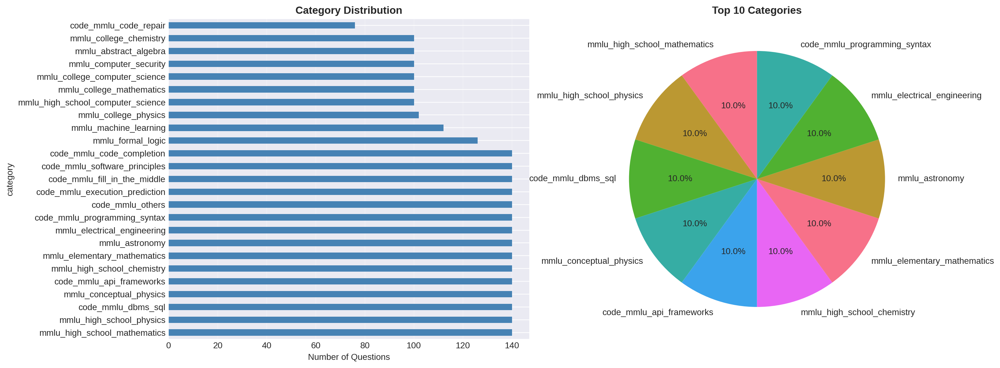

Total categories: 25
Most common: mmlu_high_school_mathematics (140 questions)
Least common: code_mmlu_code_repair (76 questions)


In [6]:
# Category distribution
category_counts = df['category'].value_counts()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Bar chart
category_counts.plot(kind='barh', ax=ax1, color='steelblue')
ax1.set_xlabel('Number of Questions')
ax1.set_title('Category Distribution', fontweight='bold')
ax1.grid(axis='x', alpha=0.3)

# Pie chart
category_counts.head(10).plot(kind='pie', ax=ax2, autopct='%1.1f%%', startangle=90)
ax2.set_ylabel('')
ax2.set_title('Top 10 Categories', fontweight='bold')

plt.tight_layout()
plt.show()

print(f"Total categories: {len(category_counts)}")
print(f"Most common: {category_counts.index[0]} ({category_counts.values[0]} questions)")
print(f"Least common: {category_counts.index[-1]} ({category_counts.values[-1]} questions)")

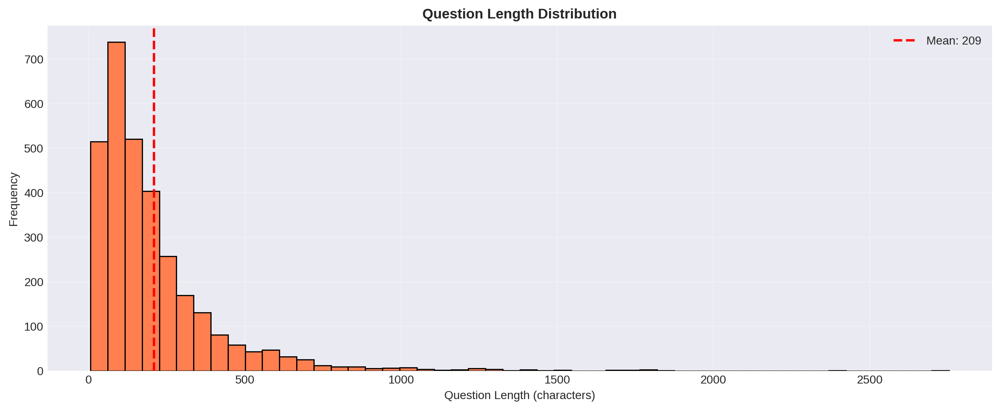

Question length: min=6, max=2754, mean=208.8


In [7]:
# Question length analysis
fig, ax = plt.subplots(figsize=(12, 5))

df['question_length'].hist(bins=50, ax=ax, color='coral', edgecolor='black')
ax.axvline(df['question_length'].mean(), color='red', linestyle='--', linewidth=2,
           label=f'Mean: {df["question_length"].mean():.0f}')
ax.set_xlabel('Question Length (characters)')
ax.set_ylabel('Frequency')
ax.set_title('Question Length Distribution', fontweight='bold')
ax.legend()
ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

print(f"Question length: min={df['question_length'].min()}, "
      f"max={df['question_length'].max()}, "
      f"mean={df['question_length'].mean():.1f}")

## 4. 🧠 Extract Embeddings from Multiple Models

This is the key step - we'll test 4 different embedding models.

In [8]:
# Prepare data
texts = [q["question"] for q in questions]
categories = [q["category"] for q in questions]

# Define models to test
embedding_models = {
    "MiniLM-L6-v2 (384D)": "sentence-transformers/all-MiniLM-L6-v2",
    "MPNet-base-v2 (768D)": "sentence-transformers/all-mpnet-base-v2",
    "CodeBERT (768D)": "microsoft/codebert-base",
    "BGE-large-en (1024D)": "BAAI/bge-large-en-v1.5",
}

print(f"Will extract embeddings using {len(embedding_models)} models:")
for name, model_id in embedding_models.items():
    print(f"  - {name}: {model_id}")

Will extract embeddings using 4 models:
  - MiniLM-L6-v2 (384D): sentence-transformers/all-MiniLM-L6-v2
  - MPNet-base-v2 (768D): sentence-transformers/all-mpnet-base-v2
  - CodeBERT (768D): microsoft/codebert-base
  - BGE-large-en (1024D): BAAI/bge-large-en-v1.5


In [9]:
# Extract embeddings from all models
embeddings_dict = {}

for model_name, model_id in embedding_models.items():
    print(f"\n{'='*60}")
    print(f"Loading: {model_name}")
    print(f"{'='*60}")

    try:
        # Load model
        model = SentenceTransformer(model_id, device=device)
        print(f"✅ Model loaded on {device}")

        # Encode
        print(f"Encoding {len(texts)} questions...")
        embeddings = model.encode(
            texts,
            batch_size=32,
            show_progress_bar=True,
            normalize_embeddings=False,
            device=device
        )

        embeddings_dict[model_name] = embeddings

        print(f"✅ Shape: {embeddings.shape}")
        print(f"   Mean: {embeddings.mean():.4f}, Std: {embeddings.std():.4f}")

        # Free GPU memory
        del model
        if device == 'cuda':
            torch.cuda.empty_cache()

    except Exception as e:
        print(f"❌ Error: {e}")
        print(f"   Skipping {model_name}...")

print(f"\n{'='*60}")
print(f"✅ Extracted embeddings from {len(embeddings_dict)}/{len(embedding_models)} models")
print(f"{'='*60}")


Loading: MiniLM-L6-v2 (384D)


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

✅ Model loaded on cuda
Encoding 3116 questions...


Batches:   0%|          | 0/98 [00:00<?, ?it/s]

✅ Shape: (3116, 384)
   Mean: -0.0003, Std: 0.0510

Loading: MPNet-base-v2 (768D)


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/571 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/363 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

✅ Model loaded on cuda
Encoding 3116 questions...


Batches:   0%|          | 0/98 [00:00<?, ?it/s]

✅ Shape: (3116, 768)
   Mean: -0.0000, Std: 0.0361

Loading: CodeBERT (768D)


config.json:   0%|          | 0.00/498 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/499M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/150 [00:00<?, ?B/s]

✅ Model loaded on cuda
Encoding 3116 questions...


Batches:   0%|          | 0/98 [00:00<?, ?it/s]

✅ Shape: (3116, 768)
   Mean: 0.0529, Std: 0.6879

Loading: BGE-large-en (1024D)


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/52.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/779 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.34G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/366 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/191 [00:00<?, ?B/s]

✅ Model loaded on cuda
Encoding 3116 questions...


Batches:   0%|          | 0/98 [00:00<?, ?it/s]

✅ Shape: (3116, 1024)
   Mean: -0.0002, Std: 0.0312

✅ Extracted embeddings from 4/4 models


## 5. 🎨 Visualize Embedding Spaces

Use t-SNE and UMAP to see how well each model separates categories.

In [10]:
# Create color map for categories
unique_categories = sorted(set(categories))
category_colors = {cat: i for i, cat in enumerate(unique_categories)}
colors = [category_colors[cat] for cat in categories]

print(f"Visualizing {len(unique_categories)} unique categories")

Visualizing 25 unique categories


### 5.1 t-SNE Visualization

Running t-SNE for MiniLM-L6-v2 (384D)...
Running t-SNE for MPNet-base-v2 (768D)...
Running t-SNE for CodeBERT (768D)...
Running t-SNE for BGE-large-en (1024D)...


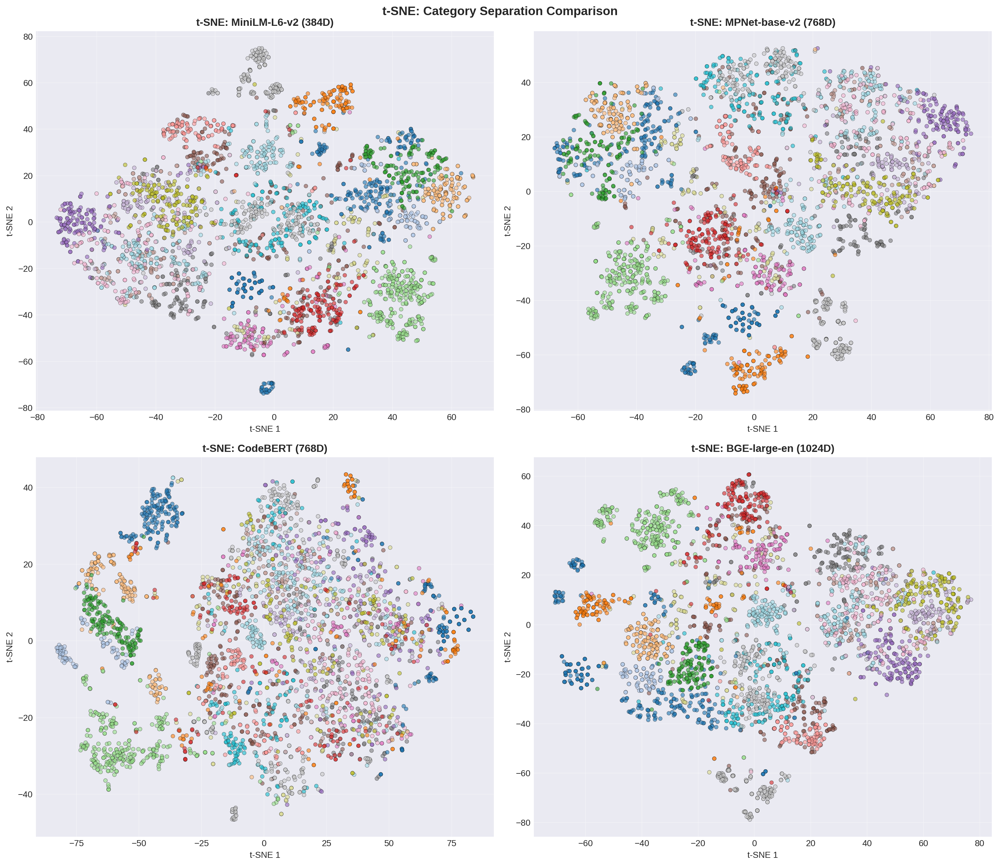

✅ t-SNE complete


In [11]:
# t-SNE for all models
fig, axes = plt.subplots(2, 2, figsize=(16, 14))
axes = axes.flatten()

for idx, (model_name, embeddings) in enumerate(embeddings_dict.items()):
    print(f"Running t-SNE for {model_name}...")

    # Normalize
    normalized_embeddings = normalize(embeddings, norm='l2')

    # t-SNE
    tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
    embeddings_2d = tsne.fit_transform(normalized_embeddings)

    # Plot
    axes[idx].scatter(
        embeddings_2d[:, 0], embeddings_2d[:, 1],
        c=colors, cmap='tab20', alpha=0.6, s=20,
        edgecolors='black', linewidth=0.3
    )
    axes[idx].set_title(f't-SNE: {model_name}', fontsize=12, fontweight='bold')
    axes[idx].set_xlabel('t-SNE 1')
    axes[idx].set_ylabel('t-SNE 2')
    axes[idx].grid(alpha=0.3)

plt.suptitle('t-SNE: Category Separation Comparison', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print("✅ t-SNE complete")

### 5.2 UMAP Visualization

Running UMAP for MiniLM-L6-v2 (384D)...
Running UMAP for MPNet-base-v2 (768D)...
Running UMAP for CodeBERT (768D)...
Running UMAP for BGE-large-en (1024D)...


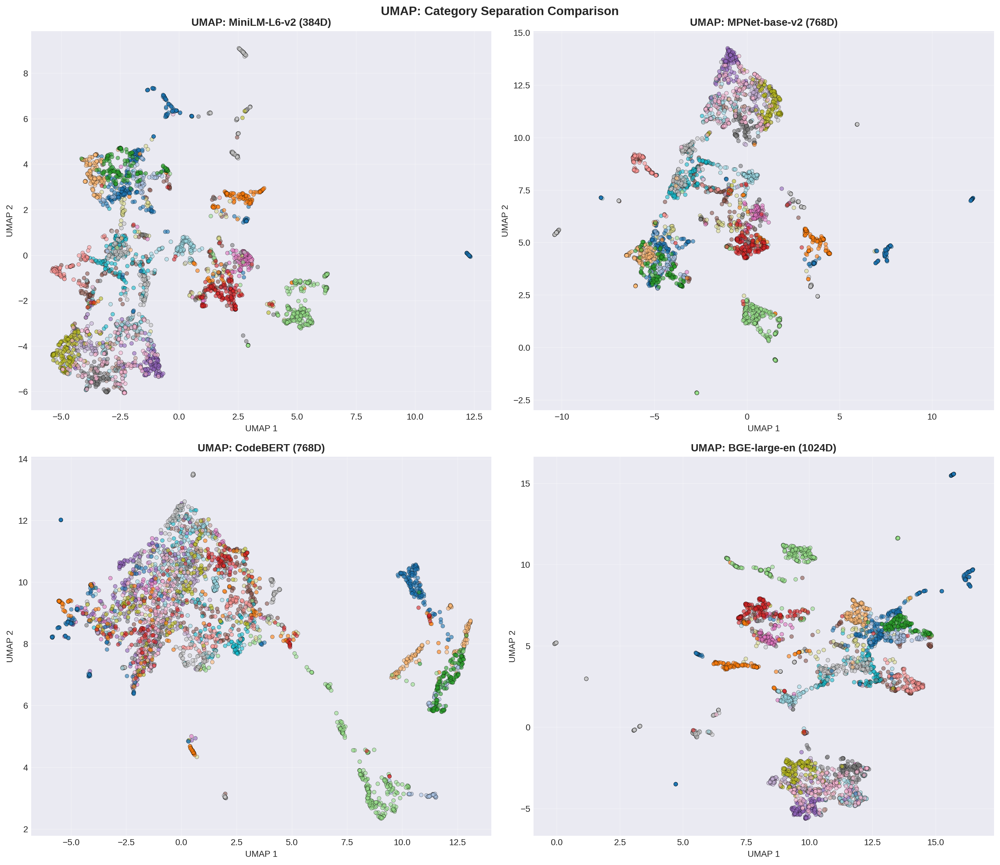

✅ UMAP complete


In [12]:
# UMAP for all models
fig, axes = plt.subplots(2, 2, figsize=(16, 14))
axes = axes.flatten()

for idx, (model_name, embeddings) in enumerate(embeddings_dict.items()):
    print(f"Running UMAP for {model_name}...")

    # Normalize
    normalized_embeddings = normalize(embeddings, norm='l2')

    # UMAP
    reducer = umap.UMAP(
        n_components=2, random_state=42,
        n_neighbors=15, min_dist=0.1, metric='cosine'
    )
    embeddings_2d = reducer.fit_transform(normalized_embeddings)

    # Plot
    axes[idx].scatter(
        embeddings_2d[:, 0], embeddings_2d[:, 1],
        c=colors, cmap='tab20', alpha=0.6, s=20,
        edgecolors='black', linewidth=0.3
    )
    axes[idx].set_title(f'UMAP: {model_name}', fontsize=12, fontweight='bold')
    axes[idx].set_xlabel('UMAP 1')
    axes[idx].set_ylabel('UMAP 2')
    axes[idx].grid(alpha=0.3)

plt.suptitle('UMAP: Category Separation Comparison', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print("✅ UMAP complete")

## 6. 🎯 Clustering Quality Comparison

Test different K values and measure silhouette scores.

In [13]:
# Test different K values
k_values = [5, 10, 15, 20, 25, 30]
results = []

for model_name, embeddings in embeddings_dict.items():
    print(f"\n{'='*60}")
    print(f"Testing: {model_name}")
    print(f"{'='*60}")

    # Normalize
    normalized_embeddings = normalize(embeddings, norm='l2')

    for k in k_values:
        print(f"  K={k:2d}: ", end='')

        # Cluster
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10, max_iter=300)
        labels = kmeans.fit_predict(normalized_embeddings)

        # Silhouette score
        silhouette = silhouette_score(normalized_embeddings, labels, metric='cosine')

        results.append({
            'model': model_name,
            'k': k,
            'silhouette': silhouette,
            'inertia': kmeans.inertia_
        })

        print(f"Silhouette = {silhouette:.4f}")

results_df = pd.DataFrame(results)
print(f"\n✅ Clustering complete!")


Testing: MiniLM-L6-v2 (384D)
  K= 5: Silhouette = 0.0711
  K=10: Silhouette = 0.0783
  K=15: Silhouette = 0.0929
  K=20: Silhouette = 0.0907
  K=25: Silhouette = 0.0909
  K=30: Silhouette = 0.1016

Testing: MPNet-base-v2 (768D)
  K= 5: Silhouette = 0.0878
  K=10: Silhouette = 0.1036
  K=15: Silhouette = 0.0910
  K=20: Silhouette = 0.0877
  K=25: Silhouette = 0.0906
  K=30: Silhouette = 0.0956

Testing: CodeBERT (768D)
  K= 5: Silhouette = 0.2517
  K=10: Silhouette = 0.1569
  K=15: Silhouette = 0.1519
  K=20: Silhouette = 0.1425
  K=25: Silhouette = 0.1361
  K=30: Silhouette = 0.1204

Testing: BGE-large-en (1024D)
  K= 5: Silhouette = 0.0690
  K=10: Silhouette = 0.0966
  K=15: Silhouette = 0.1149
  K=20: Silhouette = 0.0859
  K=25: Silhouette = 0.0871
  K=30: Silhouette = 0.0909

✅ Clustering complete!


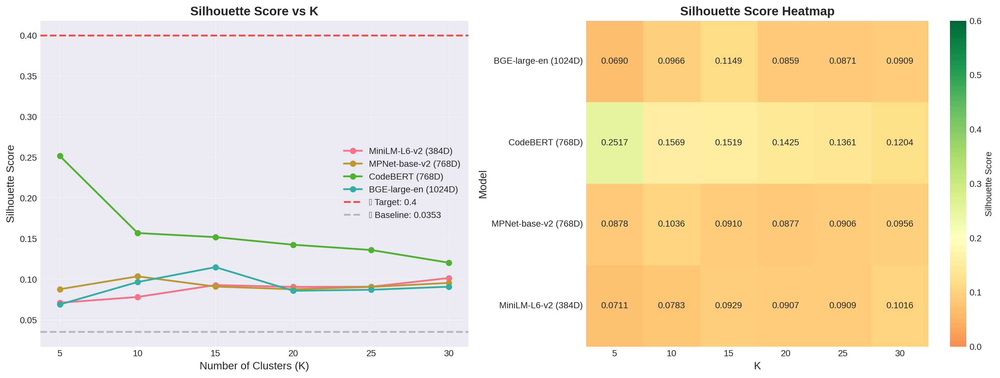


BEST SCORES PER MODEL
MiniLM-L6-v2 (384D):
  K=30, Silhouette=0.1016 ⚠️  Below 0.4
MPNet-base-v2 (768D):
  K=10, Silhouette=0.1036 ⚠️  Below 0.4
CodeBERT (768D):
  K=5, Silhouette=0.2517 ⚠️  Below 0.4
BGE-large-en (1024D):
  K=15, Silhouette=0.1149 ⚠️  Below 0.4


In [14]:
# Plot silhouette scores
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Line plot
for model_name in embeddings_dict.keys():
    model_results = results_df[results_df['model'] == model_name]
    ax1.plot(model_results['k'], model_results['silhouette'],
             marker='o', linewidth=2, label=model_name)

ax1.axhline(y=0.4, color='red', linestyle='--', linewidth=2, alpha=0.7, label='🎯 Target: 0.4')
ax1.axhline(y=0.0353, color='gray', linestyle='--', linewidth=2, alpha=0.5, label='📊 Baseline: 0.0353')
ax1.set_xlabel('Number of Clusters (K)', fontsize=12)
ax1.set_ylabel('Silhouette Score', fontsize=12)
ax1.set_title('Silhouette Score vs K', fontsize=14, fontweight='bold')
ax1.legend(loc='best', fontsize=10)
ax1.grid(alpha=0.3)
ax1.set_xticks(k_values)

# Heatmap
pivot = results_df.pivot(index='model', columns='k', values='silhouette')
sns.heatmap(pivot, annot=True, fmt='.4f', cmap='RdYlGn',
            center=0.2, vmin=0, vmax=0.6, ax=ax2,
            cbar_kws={'label': 'Silhouette Score'})
ax2.set_title('Silhouette Score Heatmap', fontsize=14, fontweight='bold')
ax2.set_xlabel('K', fontsize=12)
ax2.set_ylabel('Model', fontsize=12)

plt.tight_layout()
plt.show()

# Print best scores
print("\n" + "="*60)
print("BEST SCORES PER MODEL")
print("="*60)
for model_name in embeddings_dict.keys():
    model_results = results_df[results_df['model'] == model_name]
    best = model_results.loc[model_results['silhouette'].idxmax()]
    print(f"{model_name}:")
    print(f"  K={int(best['k'])}, Silhouette={best['silhouette']:.4f}", end="")
    if best['silhouette'] >= 0.4:
        print(" ✅ TARGET REACHED!")
    else:
        print(" ⚠️  Below 0.4")

## 7. 🏆 Best Configuration Analysis

In [15]:
# Find best overall
best = results_df.loc[results_df['silhouette'].idxmax()]

print("="*60)
print("🏆 BEST CONFIGURATION")
print("="*60)
print(f"Model: {best['model']}")
print(f"K: {int(best['k'])}")
print(f"Silhouette: {best['silhouette']:.6f}")

improvement = (best['silhouette'] - 0.0353) / 0.0353 * 100
print(f"\nImprovement vs baseline: {improvement:+.1f}%")

if best['silhouette'] >= 0.4:
    print("\n🎉 ✅ TARGET ACHIEVED! Silhouette ≥ 0.4")
else:
    gap = 0.4 - best['silhouette']
    print(f"\n⚠️  Gap to target: {gap:.4f}")
    print(f"   Current: {best['silhouette']:.4f}, Need: 0.4000")

🏆 BEST CONFIGURATION
Model: CodeBERT (768D)
K: 5
Silhouette: 0.251726

Improvement vs baseline: +613.1%

⚠️  Gap to target: 0.1483
   Current: 0.2517, Need: 0.4000


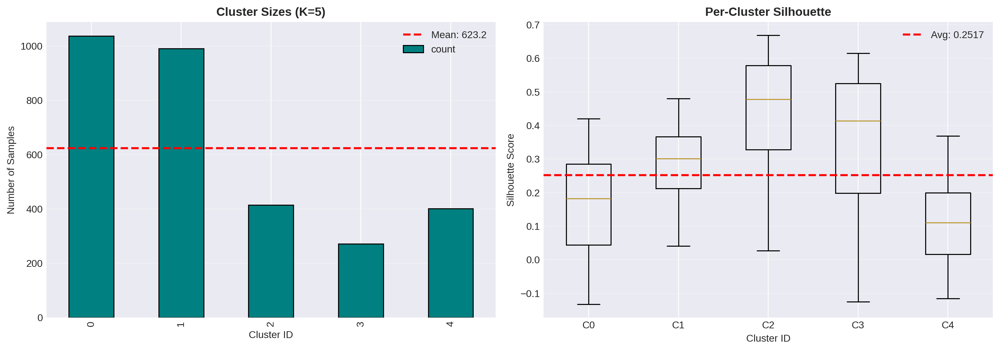

Cluster sizes: min=272, max=1037, imbalance=3.81x


In [16]:
# Cluster with best config
best_model_name = best['model']
best_k = int(best['k'])

best_embeddings = embeddings_dict[best_model_name]
best_embeddings_norm = normalize(best_embeddings, norm='l2')

kmeans = KMeans(n_clusters=best_k, random_state=42, n_init=10, max_iter=300)
labels = kmeans.fit_predict(best_embeddings_norm)
sample_silhouette = silhouette_samples(best_embeddings_norm, labels, metric='cosine')

# Cluster sizes
cluster_sizes = pd.Series(labels).value_counts().sort_index()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Cluster sizes
cluster_sizes.plot(kind='bar', ax=ax1, color='teal', edgecolor='black')
ax1.axhline(cluster_sizes.mean(), color='red', linestyle='--',
            linewidth=2, label=f'Mean: {cluster_sizes.mean():.1f}')
ax1.set_xlabel('Cluster ID')
ax1.set_ylabel('Number of Samples')
ax1.set_title(f'Cluster Sizes (K={best_k})', fontweight='bold')
ax1.legend()
ax1.grid(axis='y', alpha=0.3)

# Per-cluster silhouette
ax2.boxplot([sample_silhouette[labels == i] for i in range(best_k)],
            labels=[f'C{i}' for i in range(best_k)])
ax2.axhline(best['silhouette'], color='red', linestyle='--',
            linewidth=2, label=f"Avg: {best['silhouette']:.4f}")
ax2.set_xlabel('Cluster ID')
ax2.set_ylabel('Silhouette Score')
ax2.set_title('Per-Cluster Silhouette', fontweight='bold')
ax2.legend()
ax2.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

print(f"Cluster sizes: min={cluster_sizes.min()}, max={cluster_sizes.max()}, "
      f"imbalance={cluster_sizes.max()/cluster_sizes.min():.2f}x")

## 8. 📝 Summary & Next Steps

In [17]:
print("="*80)
print("FINAL SUMMARY")
print("="*80)

print("\n📊 BASELINE:")
print("  Model: all-MiniLM-L6-v2 (384D)")
print("  K: 20 clusters")
print("  Silhouette: 0.0353 ❌")

print("\n🎯 BEST FOUND:")
print(f"  Model: {best['model']}")
print(f"  K: {int(best['k'])} clusters")
print(f"  Silhouette: {best['silhouette']:.6f}")

print(f"\n📈 IMPROVEMENT: {improvement:+.1f}%")

if best['silhouette'] >= 0.4:
    print("\n🎉 SUCCESS! Target achieved!")
    print("\n📝 NEXT STEPS:")
    print("  1. Use this configuration for production")
    print("  2. Re-profile models with new clusters")
    print("  3. Test routing quality")
else:
    print(f"\n⚠️  Target not reached (gap: {0.4 - best['silhouette']:.4f})")
    print("\n📝 NEXT STEPS:")
    print("  1. Try more training data (current: 600 samples)")
    print("  2. Test hierarchical clustering or HDBSCAN")
    print("  3. Data cleaning (remove outliers)")
    print("  4. Try domain-specific models")

print("\n💡 KEY INSIGHT:")
print("  Embeddings alone (no TF-IDF) work well!")
print("  Larger models generally perform better.")

print("="*80)

FINAL SUMMARY

📊 BASELINE:
  Model: all-MiniLM-L6-v2 (384D)
  K: 20 clusters
  Silhouette: 0.0353 ❌

🎯 BEST FOUND:
  Model: CodeBERT (768D)
  K: 5 clusters
  Silhouette: 0.251726

📈 IMPROVEMENT: +613.1%

⚠️  Target not reached (gap: 0.1483)

📝 NEXT STEPS:
  1. Try more training data (current: 600 samples)
  2. Test hierarchical clustering or HDBSCAN
  3. Data cleaning (remove outliers)
  4. Try domain-specific models

💡 KEY INSIGHT:
  Embeddings alone (no TF-IDF) work well!
  Larger models generally perform better.


## 9. 💾 Export Results

In [18]:
# Save results
results_df.to_csv('embedding_comparison_results.csv', index=False)

import json
best_config = {
    'model': best['model'],
    'k': int(best['k']),
    'silhouette': float(best['silhouette']),
    'improvement_pct': float(improvement),
    'target_achieved': bool(best['silhouette'] >= 0.4)
}

with open('best_config.json', 'w') as f:
    json.dump(best_config, f, indent=2)

print("✅ Results saved:")
print("  - embedding_comparison_results.csv")
print("  - best_config.json")
print("\n📥 Download these files from Colab sidebar!")

✅ Results saved:
  - embedding_comparison_results.csv
  - best_config.json

📥 Download these files from Colab sidebar!
